# GAIA DR2 radial velocity transform from helio barycentric to galactic rest frame

Credits: 

1. Sarah Pearson for pointing out the importance of the shift to the galactic reference frame.
2. Adrian Price-Whelan for posting a tutorial on doing this with astropy: http://docs.astropy.org/en/stable/generated/examples/coordinates/rv-to-gsr.html.

Data:
ESA Gaia DR2:
http://cdn.gea.esac.esa.int/Gaia/gdr2/

In [35]:
# function to transform from barycentric to galactic rest frame

v_sun = coord.Galactocentric.galcen_v_sun.to_cartesian().get_xyz().to_value()

def rv_to_gsr(ra,dec,rv):
    icrs = coord.ICRS(ra=ra*u.deg, dec=dec*u.deg,
                  radial_velocity=rv*u.km/u.s)
    
    gal = icrs.transform_to(coord.Galactic)
    cart_data = gal.data.to_cartesian().get_xyz().to_value()
    unit_vector = cart_data / np.linalg.norm(cart_data)
    
    return rv+np.dot(v_sun,unit_vector)

print(v_sun)

[ 11.1  232.24   7.25]


In [37]:
coord.Galactocentric.galcen_v_sun.norm()

<Quantity 232.61812075 km / s>

That is the sun's velocity around the galaxy, effectively what we have to correct for when considering objects at galactic scale.

I downloaded the full RV CSV files since the ADQL interface was lagging, you can find these files here: http://cdn.gea.esac.esa.int/Gaia/gdr2/gaia_source_with_rv/csv/. 

This is the code I used to combine everything, and then take a random subsample

In [ ]:
# %%time

# rv_files = glob.glob('/scratch/rag394/gaia/cdn.gea.esac.esa.int/Gaia/gdr2/gaia_source_with_rv/csv/*.csv')

# file_list = []
# for file_ in rv_files:
    
#     print('concatenating file: ',file_)
#     frame = pd.read_csv(file_,index_col=None)
#     file_list.append(frame)
    
# df = pd.concat(file_list)
# df.to_csv('/scratch/rag394/DR2_rv_complete.csv')
# df.sample(1000000).to_csv('/scratch/rag394/DR2_rv_subsample.csv')

# data = df.sample(500000)
# data['rv_corrected'] = data2[['ra','dec','radial_velocity']].apply(lambda x: rv_to_gsr(x.ra,x.dec,x.radial_velocity), axis=1)
# data.to_csv('/scratch/rag394/gaia/rv_corrected_subsample.csv')

In [39]:
# df = pd.read_csv('/scratch/rag394/DR2_rv_complete.csv')
# df = pd.read_csv('/scratch/rag394/DR2_rv_subsample.csv',index_col=None)
df = pd.read_csv('/scratch/rag394/gaia/rv_corrected_subsample.csv',index_col=None)

# remove bad solutions to parallax fit by filtering out negative parallaxes:
df = df[df.parallax>0.]

# only take high snr parallaxes
df = df[(df.parallax/df.parallax_error)>5]

# calc parallax based distance (careful with small (< 30pc) objects!)
df['distance'] = 1000./df['parallax']

data = df # I filtered positive parallax and high snr before saving previous csv file for corrected sample
print(data.shape[0])

500000


/home/rag394/.local/lib/python3.6/site-packages/matplotlib/projections/geo.py:426: RuntimeWarning: invalid value encountered in arcsin
  theta = np.arcsin(y / np.sqrt(2))


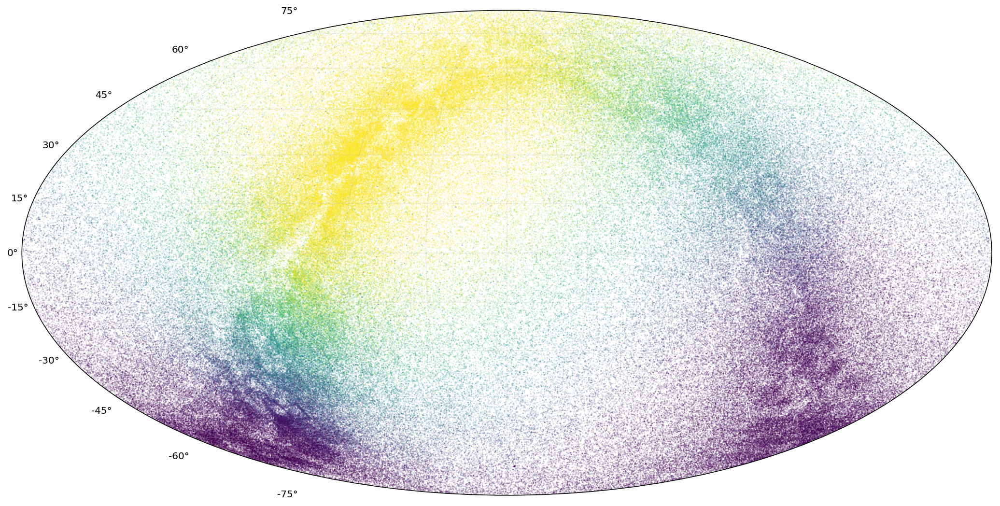

In [5]:
ra = data.ra.values
dec = data.dec.values

ra = coord.Angle(ra*u.degree)
ra = ra.wrap_at(180*u.degree)
dec = coord.Angle(dec*u.degree)

fig = plt.figure(figsize=(18,14))
ax = fig.add_subplot(111,projection='mollweide')

s = ax.scatter(ra.radian,dec.radian,c=data.rv_corrected,cmap='viridis',
               s=.007, alpha=1., vmin=-150,vmax=150)

ax.grid(alpha=0.2)

#plt.colorbar(s,ax=ax);
ax.set_xticklabels([]);

/home/rag394/.local/lib/python3.6/site-packages/matplotlib/projections/geo.py:426: RuntimeWarning: invalid value encountered in arcsin
  theta = np.arcsin(y / np.sqrt(2))


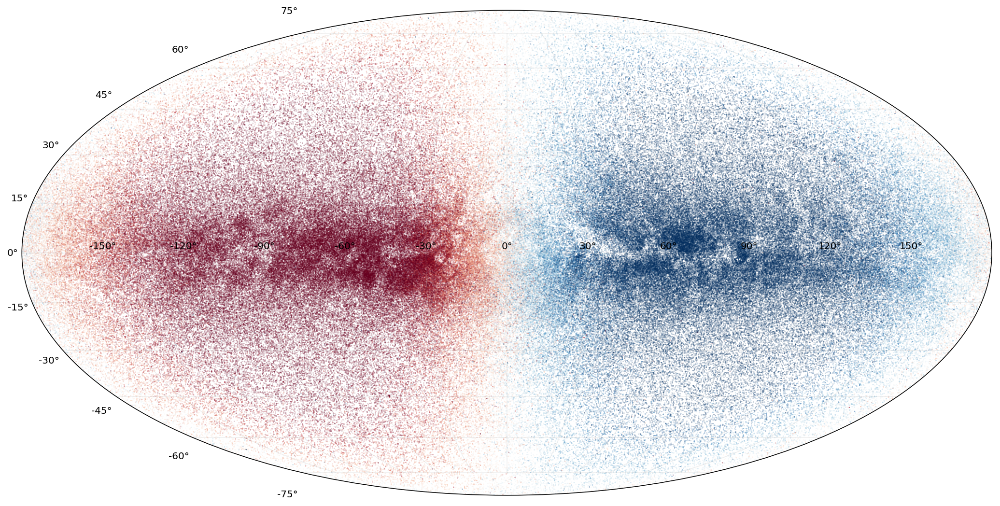

In [8]:
%matplotlib inline

ra = data.l.values
dec = data.b.values

ra = coord.Angle(ra*u.degree)
ra = ra.wrap_at(180*u.degree)
dec = coord.Angle(dec*u.degree)

fig = plt.figure(figsize=(18,14))
ax = fig.add_subplot(111,projection='mollweide')

s = ax.scatter(ra.radian,dec.radian,c=data.rv_corrected,cmap='RdBu',
               s=.009, vmin=-130,vmax=130)

ax.grid(alpha=0.2)

#plt.colorbar(s,ax=ax);
# ax.set_xticklabels([]);
# ax.set_yticklabels([])

plt.xticks('x',)

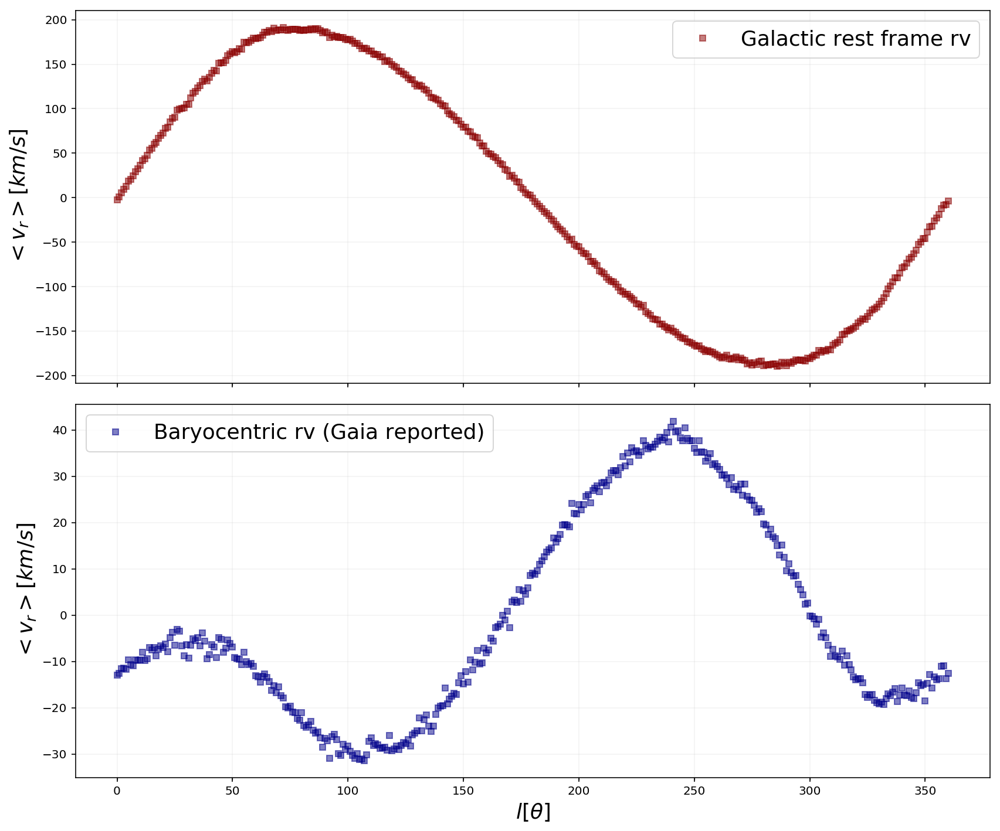

In [40]:
grouped = data.groupby('l')['rv_corrected']
mean = grouped.mean()

mean.index = np.around(mean.index,0)
mean = mean.groupby(mean.index).mean()

fig, ax = plt.subplots(figsize=(12,5*2),nrows=2,sharex=True)

mean.plot(ax=ax[0],markersize=5, marker='s',ls='',color='darkred',alpha=0.5,label='Galactic rest frame rv')
ax[0].grid(alpha=0.2)
ax[0].set_ylabel(r'$<v_r> [km/s]$',fontsize=18);

ax[0].grid(alpha=0.15)
ax[0].legend(fontsize=18,loc='best')

grouped = data.groupby('l')['radial_velocity']
mean = grouped.mean()

mean.index = np.around(mean.index,0)
mean = mean.groupby(mean.index).mean()

mean.plot(ax=ax[1],markersize=5, marker='s',ls='',color='darkblue',alpha=0.5,label='Baryocentric rv (Gaia reported)')
ax[1].grid(alpha=0.2)
ax[1].set_ylabel(r'$<v_r> [km/s]$',fontsize=18);
ax[1].set_xlabel(r'$l [\theta]$',fontsize=18)
ax[1].legend(fontsize=18,loc='best')

ax[1].grid(alpha=0.15)
fig.tight_layout();

# Includes, etc.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
import glob

import astropy.coordinates as coord
import astropy.units as u
from astropy.coordinates import SkyCoord

import torch
import torch.nn as nn
from torch.autograd import Variable

cmap=plt.cm.tab10
c = cycler('color', cmap(np.linspace(0,1,10)))
plt.rcParams["axes.prop_cycle"] = c

from astroquery.gaia import Gaia

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#Gaia.login(user='',password='')

Created TAP+ (v1.0.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: False
	Port: 80
	SSL Port: 443
